<a href="https://colab.research.google.com/github/Samuele575/unife_project_ColabKeyPointDetect/blob/main/project_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduzione progetto
Il progetto assegnato consiste nella creazione di un'applicazione che ha l'obbiettivo di predire i 4 '*landmarks*' presenti nel teschio umano utilizzati dai denstisti per stabilirie se il paziente necessita l'installamento del apparecchio odontoiatrico. I punti corrispondono a **sopracciglia**, **tempia** e i vertici di **mandibola** e **mascella**.

Il problema quindi si scompone in 2 fasi:


1.   Generare una rete neurale che predica i valori di ascisse ed ordinate dei keypoints addestrandola con una porzione dataset, suddivisi fra gli insiemi di training e validation set.  
2.   seconda è utilizzare la rete addestrata con un altro sottoinsieme di foto per il test dell'accuratezza, tracciando in fine le linee fra i 4 punti per una semplice ed efficace '*pose estimation*', ovvero una stima che permetta ad occhio di capire se la struttura ossea del paziente è proporzionata o meno (questa seconda parte è stata rimossa, anche se la funzione che traccia le linee è presente e funzionante, spiegato nelle conclusioni).

Gli strumenti utilizzati in questo colab vengono da librerie specifiche messe a disposizione di *TensorFlow, Keras e Pandas*, visti a lezione nei loro utilizzi base. In particolare in questa applicazione vengono esplorate alcune funzionalità aggiuntive e più specifiche per l'operaizone di '*facial keypoint detection*'.

NOTA: la preparazione dei file '*keypoints_definition_v6.csv*' e '*skullExams_v7.json*' è avvenuta in due file esterni a questo documento colab, passati come allegati nell'email, chiamati '*resize_image.py*' e '*from_txt.py*' e che sono stati
utilizzati per:

1. il primo standardizza la dimensione di tutte le immagini ad un semplice (400,400) pixs;

2. il secondo legge tutti i file .txt, passati con il dataset, per estrarre i valori dei '*joints*' ovvero i punti di interesse, utilizzati per addestrare la rete neurale.

# Neural Network

Il codice che precede la creazione e l'addestramento del modello serve per PREPARARE i dati da passare in input alla rete neurale stessa e consiste in una serie di funzioni che spiegate e poi successivamente utilizzate durante  il progetto principalmente per la visualizzazione a schermo dei risultati.

Si iniza a questo punto con le parti di codice vero e proprio:

Questo primo segmento serve per preparare tutto l'ambiente del colab per la creazione di una cartella *IMAGES* che contenga tutte le 470 immagini contenute nel dataset.

NOTA: la scelta di passasre attraverso il mio Drive, in cui è stato salvato un file .zip contenente tutte le immagini è dovuto ad una serie di tentativi iniziali nei quali caricavo di: il file .zip direttamente in colab, ma date le dimensioni elevate (15 Mb circa) l'operazione falliva; poi di salvare le immagini in Drive ed accedervi ogni volta che era necessario chiamare una immagine, con l'errore di desincornizzazione, fra colab e drive, ad ogni coppia di chiamate, che mi costringeva a rieseguire l'intero colab o ricaricare da zero la sessione.

In [ ]:
!unzip -qq /content/drive/MyDrive/Images.zip -d /content/Images
!pip -q install tensorflow
!mkdir /content/outputs
!mkdir /content/outputs/saved_model
!mkdir /content/Images/test
!mkdir /content/Images/valid

Segue poi la fase di *import* classica.

In [ ]:
#import cv2 NON PUO' FUNZIONARE PERCHE' COLAB NON ALLOCA ABBASTANZA RISORSE
from tensorflow.keras.utils import Sequence

from tensorflow.keras import layers
from tensorflow import keras
import tensorflow as tf
import pandas as pd
import numpy as np

#queste non vengono ancora utilizzate servono per l'augmentation
from imgaug.augmentables.kps import KeypointsOnImage
from imgaug.augmentables.kps import Keypoint
import imgaug.augmenters as iaa

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import cv2

from tqdm import tqdm
import json
import os
import math
import random
# example of calculate the mean squared error
from sklearn.metrics import mean_squared_error


Questi due import li ho tenuti in disparte perchè servono DURANTE l'addestramento della rete neurale per:


1.  Primo, ad ogni esecuzione veniva visualizzato un '*WARNING*' perchè la classe di keypoint detection di *TensorFlow* contiene delle funzioni obsolete ma comunque presenti nelle classi utilizzate durante il processo di addestramento, ma siccome non vengono mai utilizzate su *StackOverflow* consigliavano di 'zittirli', e questo è il codice che elimina la verbosità durante l'addestramento.  

2.   Secondo, questo import serve per risolvere un problema che mi dava inizialmente l'applicazione durante la creazione del modello, serve per impostare un formato assoluto per le immagini passate in input al modello, l'errore risultante impediva l'esecuzione della funzione di *.fit()* dato che alcune funzioni utilizzate durante l'addestramento lavorano con immagini nel formato *(CHANNEL_RGB, SIZE)* mentre altre con *(SIZE, CHANNEL_RGB)*.



In [ ]:
# PRIMO
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)
# SECONDO
from keras import backend as K
K.set_image_data_format('channels_last')

Questa parte definisce tutti gli iperparametri che verranno utilizzati durante l'esecuzione.

In [ ]:
# Input root path.
IMG_PATH = "/content/Images/Images/"
IMG_VALID_PATH = "/content/Images/valid/"
IMG_TEST_PATH = '/content/Images/test'
# Learning parameters.
BATCH_SIZE = 16
LR = 0.001
EPOCHS = 75
IMAGE_SIZE = 400
# Train/test split.
TEST_SPLIT = 0.15
# This hyperparamiter is linked to the BATCH_SIZE and
NUM_SAMPLE_TO_AUG = BATCH_SIZE * math.floor(BATCH_SIZE*0.3)
#tentativo di generare un TEST sample rendendo più uniforme la suddivisione
IMAGES_TOT = 470
IMAGES_TRAIN = 381
IMAGES_VALID = 67
IMAGES_TEST = 22

# DataSet

Il dataset, passato nel file JSON, sono contenute le specifiche legate ad ogni immagine, come il percorso all'immagine stessa e la lista di coordinate dei 4 punti da passare come input al modello da addestrare.

La *get_skull* è una funzione di comodo chiamata più volte durante l'applicazione. Le funzionalità sono: leggere l'immagine come array di pixel e aggiornare il percorso all'immagine, salvate nel colab nella cartella 'Image'.

In fine si legge un file .csv che contiene le specifiche di ogni *Keypoints*, e li stampa a video.

NOTA: la parte in cui usavo cv2 per il resize al volo le ho eliminate perchè risultavano in un modello anche meno accurato di quanto già non fosse.

In [ ]:
JSON = "skullExams_v7.json"
KEYPOINT_DEF = "keypoint_definitions_v6.csv"

# Load the ground-truth annotations.
with open(JSON) as infile:
    json_data = json.load(infile)

# Set up a dictionary, mapping all the ground-truth information
# with respect to the path of the image.
json_dict = {json_data[i]["img_path"]: json_data[i] for i in json_data}

# Utility for reading an image and for getting its annotations.
def get_skull(name):
    data = json_dict[name]

    img_path = IMG_PATH + data["img_path"]
    img_data = np.array(Image.open(img_path))
    #attenzione potremmo avere dei problemi con questa aggiunta
    #qui si fa il reshape della immagine DA (400,400,3) -> (400,400,1)
    #gray = cv2.cvtColor(img_data, cv2.COLOR_BGR2GRAY) # ADD THIS
    #new_img = cv2.resize(gray, (400,400))
    data["img_data"] = img_data
    data["img_new_path"] = img_path

    return data

#specifiche dei keypoints utilizzate successivamente
keypoint_def = pd.read_csv(KEYPOINT_DEF)
keypoint_def.head()
print(keypoint_def.head())

   Count  Index Name Hex colour    Description
0      0      1    A     d82400         tample
1      1      2    B     48b455        eyebrow
2      2      3    C     0090aa  front maxilla
3      3      4    S     d848ff       mandible


GLi elementi contenuti nella json sono nella forma:

    "5":{
    "img_path": "5.jpg",
    "img_path_JPG": "5.jpg",
    "joints":
      [[192.46861924686192, 145.2054794520548, "A"],
      [294.49093444909346, 117.0376712328767, "B"],
      [305.64853556485355, 217.0376712328767, "C"],
      [290.0278940027894, 307.4486301369863, "S"]],
    "size": [400, 400]}

# Visualizzazione dati

Di seguito vengono create una serie di fiunzioni utility per la visualizzazione di immagini e confronoto dei punti chiavi, originali e predetti.

La funzione '*evaluation_keypoints_plot*' seguente esegue  una stampa di confronto in cui input vengono passati l'immagine, le uscite keypoints, i punti chiave originali e il *save_path* stringa per salvare l'immagine nel colab. Con queste informazioni verranno tracciati i punti chiave originali, su cui è stato fatto training, che quelli predetti (attraverso regressione) dalla rete una volta addestrata, sull'immagine del *validation set*.

Dare un'occhiata alle immagini permetterà di capire il livello di apprendimento del modello di deep learning costruito con TensorFlow.



In [ ]:
#questa sarà da rivedere non sapendo come il modello mangerà e sputerà fuori l'array di keypoints
plt.style.use('ggplot')
def evaluation_keypoints_plot(
    image, outputs, orig_keypoints, counter, save_path
):
    """
    This function plots the regressed (predicted) keypoints from all the
    evalutaion images.
    """
    output_keypoint = outputs.reshape(-1, 2)
    orig_keypoint = orig_keypoints.reshape(-1, 2)
    #image = image.reshape(IMAGE_SIZE,IMAGE_SIZE)
    plt.style.use('default')
    plt.imshow(image)
    plt.axis('off')
    # calculate errors
    errors = mean_squared_error([float(orig) for orig in orig_keypoints], [float(pred) for pred in outputs])
    # report error
    stringa = "Mean squared errors in image " + str(counter) + ": " + str(errors)
    plt.text(5,5, stringa)
    for p in range(output_keypoint.shape[0]):
        plt.scatter( float(output_keypoint[p, 0]), float( output_keypoint[p, 1]), c='white', marker='x', linewidths=3)
        plt.text(output_keypoint[p, 0], output_keypoint[p, 1], valuta_text(p))
        plt.scatter( float(orig_keypoint[p, 0]), float(orig_keypoint[p, 1]), c='white', marker='o', linewidths=3)
        plt.text(orig_keypoint[p, 0], orig_keypoint[p, 1], valuta_text(p) + "N")

    plt.show()
    plt.savefig(save_path)
    plt.close()

Altre 2 funzioni utlizzate successivamente per visualizzare:

1.   '*test_keypoints_plot*', questa funzione verrà utilizzata dopo l'addestramento, mostrando i risultati della '*predict*' anche per stimare i punti chiave sulle immagini dell'insieme di test mai visulaizzate dalla rete.



In [ ]:
def valuta_text(number):
  point = 'S'
  if number == 0:
    point = 'A'
  elif number == 1:
    point = 'B'
  elif number == 2:
    point = 'C'
  return point

def test_keypoints_plot(image, outputs, counter, save_path):
    """
    This function plots the keypoints for the outputs and images
    from the `test.csv` file.
    """
    output_keypoint = outputs.reshape(-1, 2)
    #image = image.reshape(96, 96)
    plt.style.use('default')
    plt.imshow(image)
    plt.axis('off')
    for p in range(0, len(output_keypoint)):
        plt.scatter( float(output_keypoint[p, 0]), float(output_keypoint[p, 1]), c='red', marker='o', linewidths=3)
        plt.text(output_keypoint[p, 0], output_keypoint[p, 1], valuta_text(p))

    plt.show()
    plt.savefig(save_path)
    plt.close()

2.   '*dataset_keypoints_plot*', questa funzione accetta una sequenza di immagini e mostra le prime 10 facce con i loro punti chiave.

In [ ]:
def dataset_keypoints_plot(data):
    """
    This function shows the image faces and keypoint plots that the model
    will actually see. This is a good way to validate that our dataset is in
    fact correct and the faces align with the keypoint features.
    """
    plt.figure(figsize=(40, 40))
    for i in range(10):
        #immagine
        img = data[0][0][i]
        #img = np.array(img, dtype='float32')
        #img = img.reshape(IMAGE_SIZE, IMAGE_SIZE)
        plt.subplot(5, 2, i+1)
        plt.imshow(img)
        #keypoints section
        keypoints = data[0][1][i]
        keypoints = keypoints.reshape(-1, 2)
        for j in range(len(keypoints)):
            plt.scatter( float(keypoints[j, 0]), float( keypoints[j, 1]), c='red', marker='x', linewidths=3)
            plt.text(keypoints[j, 0], keypoints[j, 1], valuta_text(j))
    plt.show()
    plt.close()

Ora, abbiamo solo un'altra funzione di supporto. È usata semplicemente per tracciare e salvare i grafici delle perdite su disco e mostrarle a schermo.

In [ ]:
def save_plots(history):
    """
    Function to save the loss and accuracy plots to disk.
    """
    train_loss = history.history['loss']
    valid_loss = history.history['val_loss']
    # Loss plots.
    plt.figure(figsize=(12, 9))
    plt.plot(
        train_loss, color='orange', linestyle='-',
        label='train loss'
    )
    plt.plot(
        valid_loss, color='red', linestyle='-',
        label='validataion loss'
    )
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig(os.path.join(
        '/content', 'outputs', 'loss.png'
    ))
    plt.show()

# Prearare il Dataset

A questo punto si deve considerare che il dataset contiene solo 470 immagini con cui lavorare per addestrare il nostro modello. Quindi una volta scelto il numero di immagini che andranno a comporre il training e validation datasets, ci si deve ricordare di lasciare qualche immagine per l'insieme di test. La scelta della suddivisione dovrà essere in funzione del numero di foto che si include in ogni batch di addestramento, solitamente 32 o 64, ma che nel nostro caso, dato il numero esiguo di immagini, sarà portato a 16.

Questo split deve avvenire prima di quello training e vaildation attraverso la funzione *train_test_split* seguita poi dalla *train_validation_split*.

In [ ]:
def train_validation_split(samples):
    np.random.shuffle(samples)
    train_keys, validation_keys = (
        samples[int(len(samples) * TEST_SPLIT) :],
        samples[: int(len(samples) * TEST_SPLIT)],
    )

    #train_dataset = KeyPointsDataset(train_keys, train_aug)
    #validation_dataset = KeyPointsDataset(validation_keys, test_aug, train=False)

    print(f"Total batches in training set: {len(train_keys)}")
    print(f"Total batches in validation set: {len(validation_keys)}")

    return train_keys, validation_keys

def train_test_split(samples):
    np.random.shuffle(samples)
    test_samples, train_val_samples = (
        samples[:IMAGES_TEST],
        samples[IMAGES_TEST:],
    )

    print(f"Total batches in training and validation set: {len(train_val_samples)}")
    print(f"Total batches in test set: {len(test_samples)}")

    return test_samples, train_val_samples

# Sequence Data Class

Il passo successivo, motlo importante, è quindi quello di scrivere una funzione che estenda la classe *Sequence* per definire gli elementi del dataset in maniera personalizzata, ovvero definendo il numero di *keypoints* presneti nella figura che la rete neurale dovrà predirre.

Questa classe impone di implementare i metodi: __len__ e __getitem__. Inoltre, dobbiamo assicurarci che il metodo __getitem__  restituisce un batch completo di dati secondo il batch_size
passato durante l'inizializzazione, nel nostro caso variabile globale settato a 16. L'inizializazione prende in ingresso un insieme di chiavi che puntano ad elementi dell'oggetto json_data in cui sono contenute tutte le informazioni inerenti alle immagini, compreso l'immagine in pixels contenuto in un NumPy array. Il cuore della classe è tuttavia la funzione __data_generator che ha due compiti: standardizza i valori dei keypoints letti dal file .json sotto la voce 'joints' come già anticipato; il secondo compito è quello di applicare la funzione di *augmentation* ad alcune immagini e keypoints che verrà descritta successivamente.

In [ ]:
class FaceKeypointDataset(Sequence):
    def __init__(self, image_keys, aug, boolean=False, batch_size=BATCH_SIZE,train=True):
        self.batch_size = batch_size
        #samples = dizionario da json, quindi posso trasformare qualsiasi dizionario in un DataFrame pandas
        #self.data = samples
        self.aug = aug
        self.trainig_boolean = boolean
        self.image_keys = image_keys
        self.indexes = np.arange(len(self.image_keys))
        self.train = train

    def __len__(self):
        return len(self.image_keys) // self.batch_size
    '''
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_keys))
        if self.train:
            np.random.shuffle(self.indexes)
    '''

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        image_keys_temp = [self.image_keys[k] for k in indexes]
        (images, keypoints) = self.__data_generation(image_keys_temp)

        return (images, keypoints)

    def __data_generation(self, image_keys_temp):

        final_images = []
        final_keypoints = []

        for i, key in enumerate(image_keys_temp):

            data = get_skull(key)
            image = data['img_data']
            current_keypoint = np.array(data["joints"])[:, :2]

            image = image.reshape(IMAGE_SIZE,IMAGE_SIZE,3)

            if self.trainig_boolean: #and ( i <= 1 or ( math.floor(IMAGES_TRAIN/3) < i and  i < math.floor(IMAGES_TRAIN/3) +  math.floor(NUM_SAMPLE_TO_AUG/3) ) or (math.floor(IMAGES_TRAIN/2) < i and  i < math.floor(IMAGES_TRAIN/2) +  math.floor(NUM_SAMPLE_TO_AUG/3) ) or i > IMAGES_TRAIN - math.floor(NUM_SAMPLE_TO_AUG/3) ):
              kps = []
              # Get the keypoints FOR THE AUG func
              for str_x,str_y in current_keypoint:
                kps.append(Keypoint(float(str_x),float(str_y)))

              #Keypoints and KeypointsOnImage are class use by imgaug for simple rotation and rescale on multiple object
              kps_on_img = KeypointsOnImage(kps,shape=image.shape)

              #Applying the AUG function on IMAGE and KEYPOINTS
              f_img, f_kps = self.aug(image=image, keypoints=kps_on_img)

              #Scale the coordinates to [0, 1] range. This has no repercussion
              #f_img = f_img.reshape(IMAGE_SIZE,IMAGE_SIZE)
              f_img = f_img / 255.0

              #finaly we trasform the imgaug.Keypoint object back on simple list of float
              kp_temp = []
              for keypoint in f_kps:
                  kp_temp.append(float(keypoint.x))
                  kp_temp.append(float(keypoint.y))

              final_images.append(f_img)
              final_keypoints.append(np.asarray(kp_temp))

            else :
              #Scale the coordinates to [0, 1] range. This has no repercussion
              image = image / 255.0

              # Get the keypoints. FIRST ATTEMPT
              keypoints = np.ravel(current_keypoint)
              float_keypoints = list(map(float, keypoints))

              final_images.append(image)
              final_keypoints.append(float_keypoints)

        final_images = np.array(final_images)
        final_keypoints = np.array(final_keypoints)

        return (final_images, final_keypoints)

La funzione di seguito definisce una funzione con la sintassi della libreria imgaug, usata per l'*augmentation* di immagini, ottima sia come strumento per la regolarizazione, per rendere più difficile l'*overfitting* durante il l'addestramento del modello modificando le immagini a piacere.
Nel nostro caso la funzione dovrà solo ruotare l'immagine.

NOTA: il modulo '*Sometimes()*' permette di applicare la funzione di ridimensionamento solo ogni tanto, la percentuale di volte è personalizzabile. Il problema con questa funzione, che ho incontrato e come si vedrà poi non è stato corretto, è che nel mio modello le modifiche all'immagine venivano separate da quelle dei keypoints, che rimanenvano invariati a volte, questo mi ha portato, durante uno dei tanti test, a programmare la ricerca "imponendo a mano" ogni qual volta modificare le immagini.

In [ ]:
train_aug = iaa.Sequential(
    [
        iaa.Sometimes(0.3, iaa.Affine(rotate=10, scale=(1, 1)) )
        #iaa.Affine(rotate=10, scale=(1, 1)),
    ]
)

simple_aug = iaa.Sequential([iaa.Resize(IMAGE_SIZE, interpolation="linear")])

A questo punto non rimane che dividere le immagini nei 3 sottoinsiemi di training, validation e test.

Ora, dobbiamo solo finire la preparazione del dataset creando l'ultima funzione per preparare i frame di dati per l'addestramento e validazione, poi mostrando a video le prime 10 immagine, su cui chiaramente vengono aggiunti i rispettivi keypoints.

Total batches in training and validation set: 448
Total batches in test set: 22
Total batches in training set: 381
Total batches in validation set: 67


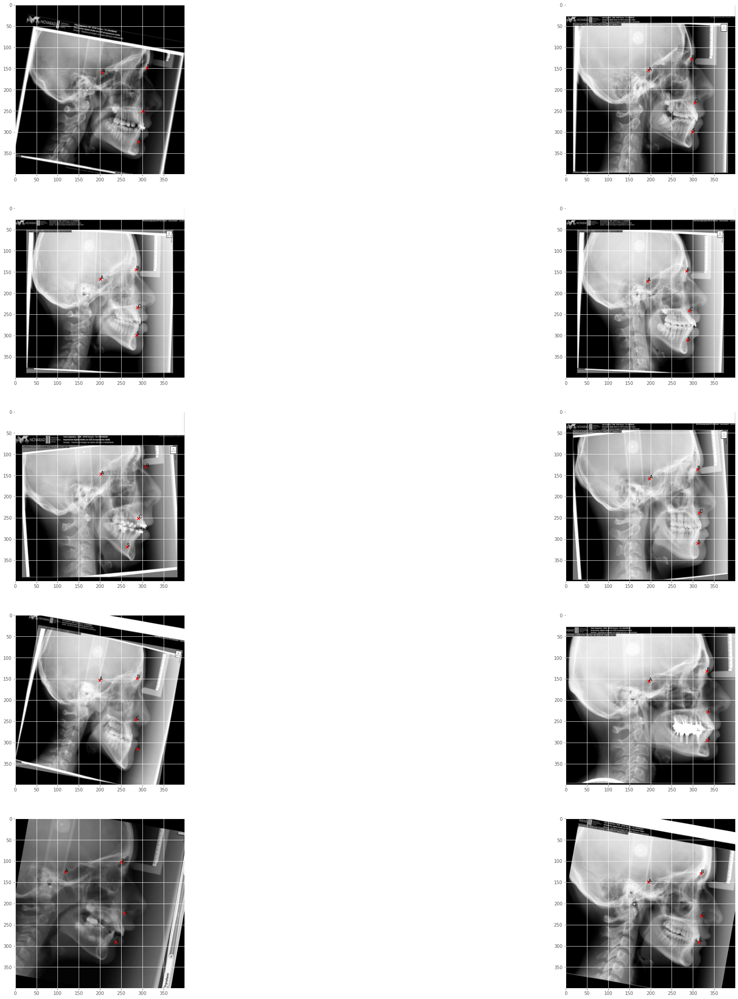

In [ ]:
samples = list(json_dict.keys())

#Test and trainig separation
test_samples, train_val_samples = train_test_split(samples)
test_ds = FaceKeypointDataset(test_samples,aug=None)

#validation and trainig ssplitting
training_samples, valid_samples = train_validation_split(train_val_samples)

def get_data():
    train_ds = FaceKeypointDataset(training_samples,train_aug,boolean=True)
    valid_ds = FaceKeypointDataset(valid_samples,aug=None)

    return train_ds, valid_ds

# Load the training and validation data.
train_ds, valid_ds = get_data()

dataset_keypoints_plot(train_ds)

# Neural Network Model

Come già anticipato, il modello di rete neurale tenterà di regredire gli 8 keypoints. Ciascuno di essi corrisponde a un insieme di 4 coppie di ascisse ed ordinate, coordinate nel piano *xy*, dei punti chiave sul teschio. L'output della rete permette di visualizzare, grazzie alla densità dello strato finale della rete, il numero di "valori" che la rete cercherà di regredire dalle immagini.

Come si può vedere, invece di codificare la dimensione dell'immagine di input, la passiamo come parametro a alla funzione *build_model*, ciò assicurerà che il codice del modello rimanga coerente con la dimensione dell'immagine durante il processo, anche nel caso si vengano ad utilizzare delle immagini con un'altra size.

A parte questo, il modello è piuttosto semplice. Innanzitutto, abbiamo un impilamento di livelli convoluzionali 2D, attivazione ReLU e livelli di max-pooling 2D. La parte lineare conclusiva della rete è costituita da due layer *Dense* strati, di cui l'ultimo è la regredirà i valori con le 8 unità finali.

In [ ]:
def build_model_first(image_size):
    inputs = layers.Input(shape=(image_size[0], image_size[1], 3))
    # Conv => Activation => Pool blocks.
    x = layers.Conv2D(16, kernel_size=(5, 5))(inputs)
    x = layers.ReLU() (x)
    x = layers.MaxPool2D((2, 2))(x)
    x = layers.Conv2D(32, kernel_size=(3, 3))(x)
    x = layers.ReLU()(x)
    x = layers.MaxPool2D((2, 2))(x)
    x = layers.Conv2D(64, kernel_size=(3, 3))(x)
    x = layers.ReLU()(x)
    x = layers.MaxPool2D((2, 2))(x)
    x = layers.Conv2D(128, kernel_size=(3, 3))(x)
    x = layers.ReLU()(x)
    x = layers.MaxPool2D((2, 2),padding = "same")(x)

    x = layers.Conv2D(256, kernel_size=(3, 3))(x)
    x = layers.ReLU()(x)
    x = layers.MaxPool2D((2, 2))(x)

    # Linear layers.
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(units=128)(x)
    x = layers.ReLU()(x)
    #inparticolare questo strato finale di output DEVE essere = al numero di keypoint cercati [A,B,C,S] = 4 nel nostro caso
    x = layers.Dense(units= 4 * 2)(x)

    model = tf.keras.Model(inputs, outputs=x)
    return model


Il modello seguente lo ho lasciato anche se il risultato verrà visualizzato solo durante le conclusioni per parlare degli altri tentativi di rete che ho provato a realizzare. Questa in particolare è stata ispirata dalla AlexNet.

In [ ]:
#------------------------------------------------------OBSOLETA
def build_model_AlexNet(image_size):
  model = keras.models.Sequential([
      keras.layers.Conv2D(filters=16, kernel_size=(5,5), strides=(3,3), activation='relu', input_shape=(image_size[0],image_size[1],3)),
      keras.layers.BatchNormalization(),
      keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
      keras.layers.Conv2D(filters=32, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
      keras.layers.BatchNormalization(),
      keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
      keras.layers.Conv2D(filters=64, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
      keras.layers.BatchNormalization(),
      keras.layers.Conv2D(filters=128, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
      keras.layers.BatchNormalization(),
      keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
      keras.layers.BatchNormalization(),
      keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
      keras.layers.Flatten(),
      keras.layers.Dense(128, activation='relu'),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(32, activation='relu'),
      keras.layers.Dense(4*2)
  ])

  return model

A questo punto si può procedere con l'addestramento della rete, recuperando gli elementi di *train_ds* e *valid_ds* definiti precedentementi durante lo split.

Notare che durante la compilazione del modello creiamo un callback di *checkpoint* per salvare il modello migliore in base al valore di perdita.

Una volta inizializzato il trainig del modello ed iniziamo il compilamento. Siccome si sta utilizzando una semplice metrica con perdita a *MeanSquaredError*.

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 396, 396, 16)      1216      
                                                                 
 re_lu (ReLU)                (None, 396, 396, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 198, 198, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 196, 196, 32)      4640      
                                                                 
 re_lu_1 (ReLU)              (None, 196, 196, 32)      0         
                                                             

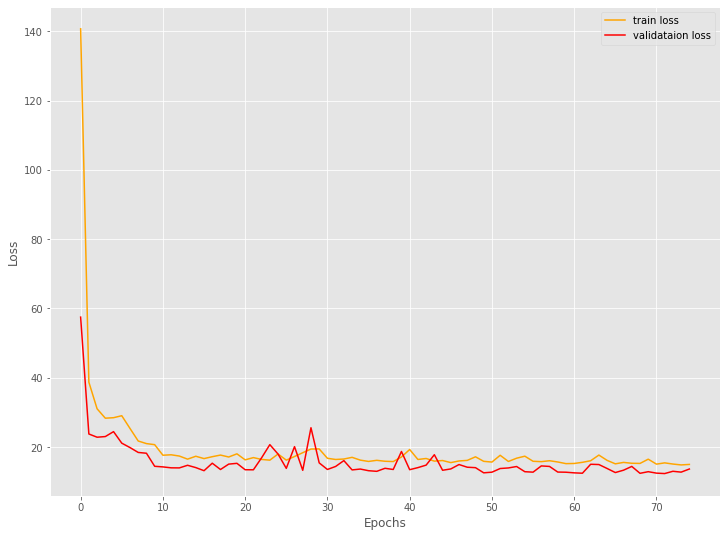

In [ ]:
# Model checkpoint callback.
model_ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/outputs/saved_model',
    monitor='val_loss',
    mode='auto',
    save_best_only=True
)

# Build and compile the model.
model = build_model_first((IMAGE_SIZE, IMAGE_SIZE))
print(model.summary())

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=tf.keras.losses.MeanAbsoluteError(),
)

# Train the model.
history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCHS,
    callbacks=[model_ckpt],
    workers=4,
    use_multiprocessing=True
)

save_plots(history)

# Inferenza da modello addestrato

Al termine dell'addestramento, abbiamo il modello addestrato all'interno della cartella '*outputs/saved_model*', che verrà utilizzato per:



1.   Per prevedere i punti chiave nel validation set e verificare in che modo i punti chiave previsti, o regrediti, corrispondono a quelli originali.
2.   Per prevedere i punti chiave sulle immagini contenuti nell insieme di test, precedentemente splittato, e mai visualizzate dalla rete neurale.



In [ ]:
# Post model.fit(): need
# Create directory to save validation results.
validation_result_path = os.path.join('/content', 'outputs', 'validation_results')
os.makedirs(os.path.join(validation_result_path), exist_ok=True)
# Create directory to save test results.
test_result_path = os.path.join('/content', 'outputs', 'test_results')
os.makedirs(os.path.join(test_result_path), exist_ok=True)
model = tf.keras.models.load_model('/content/outputs/saved_model')
print(model.summary())
_, valid_ds = get_data()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 396, 396, 16)      1216      
                                                                 
 re_lu (ReLU)                (None, 396, 396, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 198, 198, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 196, 196, 32)      4640      
                                                                 
 re_lu_1 (ReLU)              (None, 196, 196, 32)      0         
                                                             

La funzione '*evaluate*' prende in ingresso il validation set e compie la regressione in loop su tutte le immagini e poi, salva l'immagine, mostrandola a schermo contemporanemente, e disegnandovi sopra sia i keypoints originali sia i punti previsti, evidenziando graficamente l'imprecisione del modello. Viene inoltre scritto nella parte superiore dell'immagine il valore risultante dalla *MeanSquareError*, che calcola la differenza fra i keypoints originali e quelli predetti dal modello.

NOTA: il modello non è assolutamente preciso 100%, ma si notano delle ottime regressioni, così come dei casi completamente errati.

Evaluating...
4/4 [==============================] - 7s 1s/step


  0%|          | 0/4 [00:00<?, ?it/s]

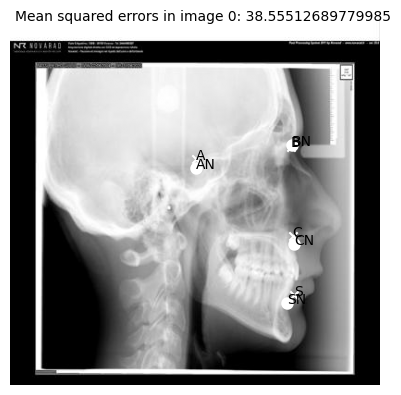

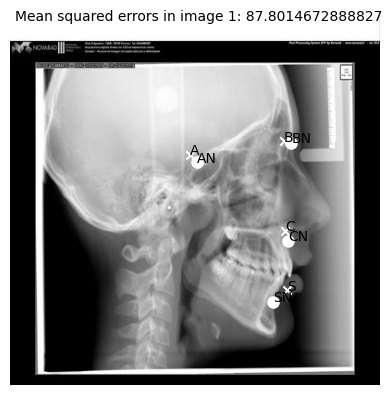

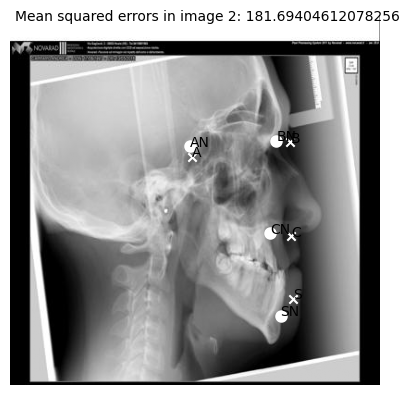

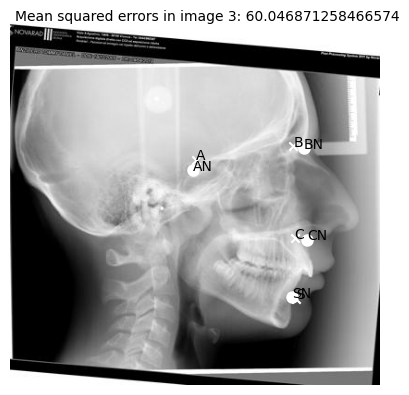

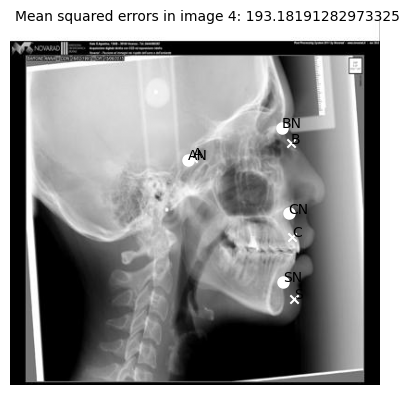

...

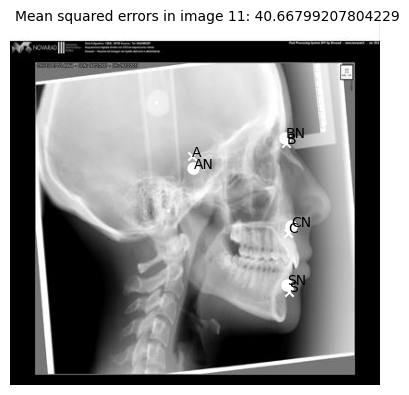

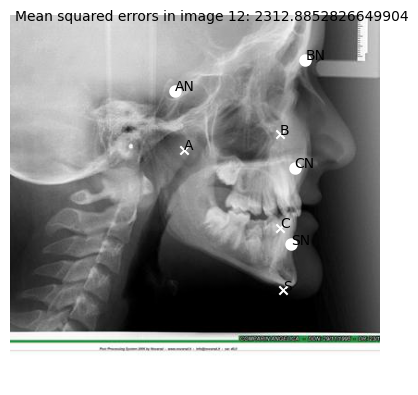

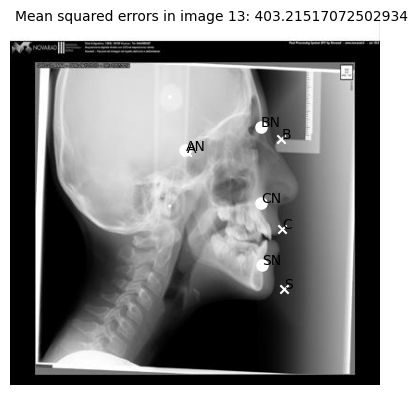

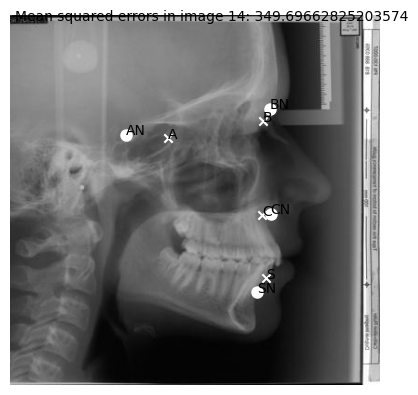

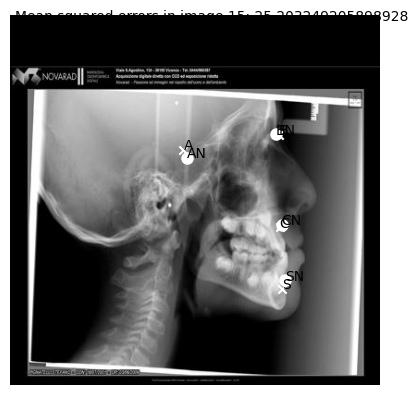

 25%|██▌       | 1/4 [00:04<00:14,  4.99s/it]

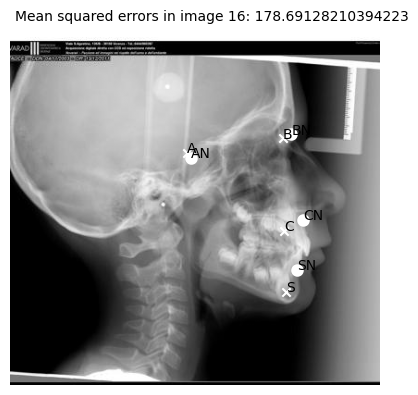

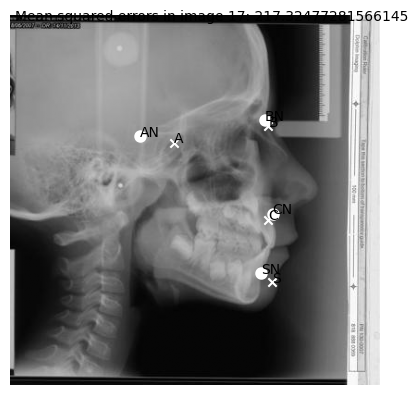

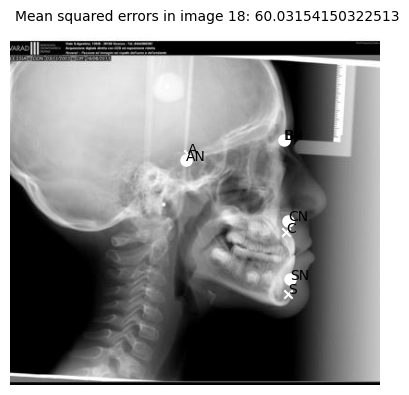

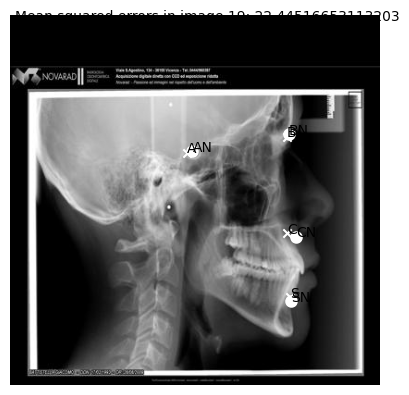

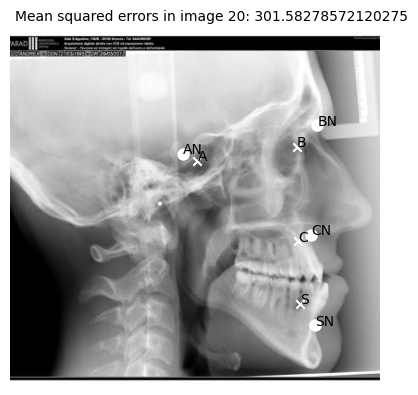

...

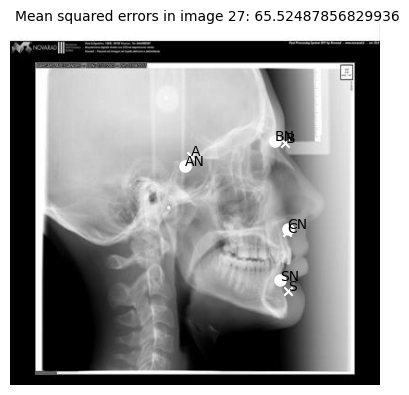

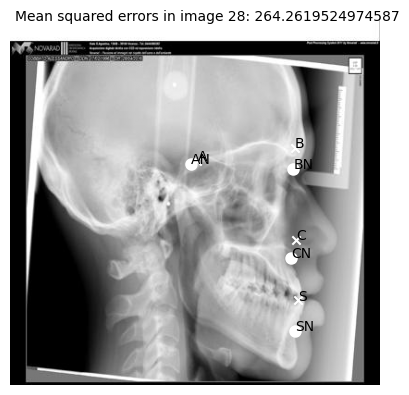

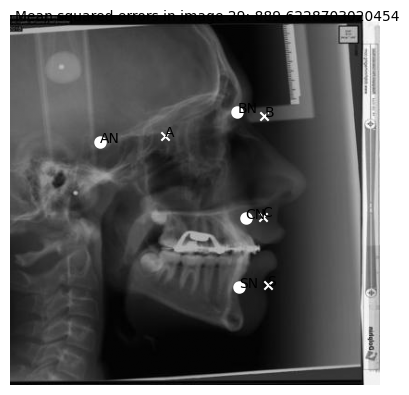

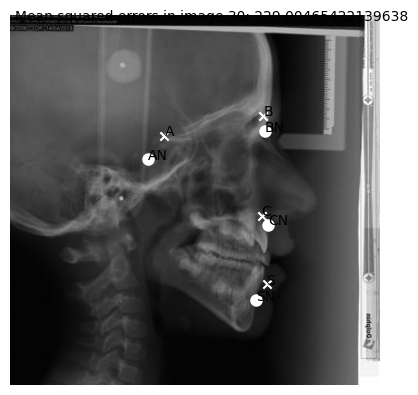

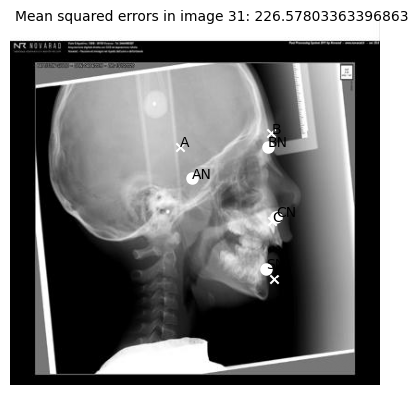

 50%|█████     | 2/4 [00:10<00:10,  5.02s/it]

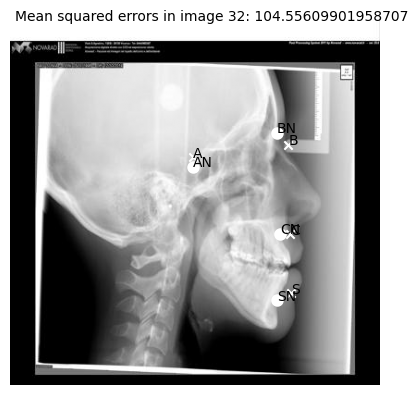

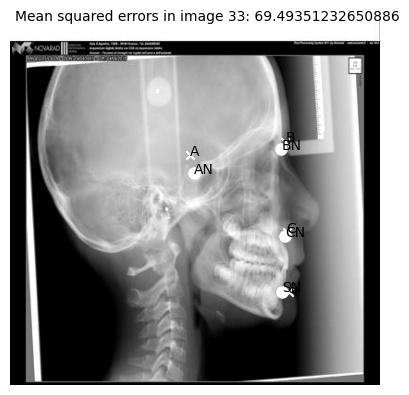

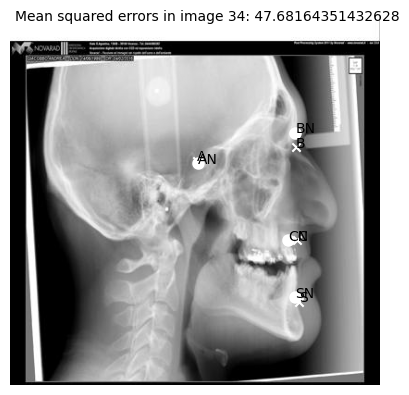

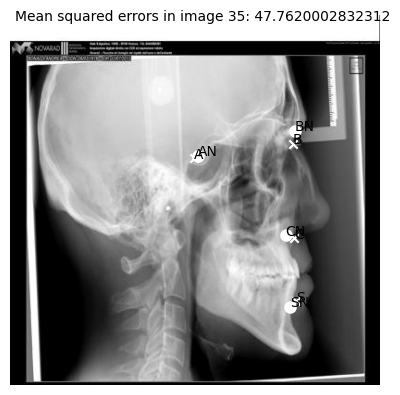

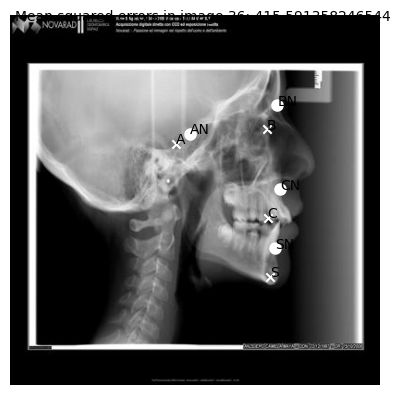

...

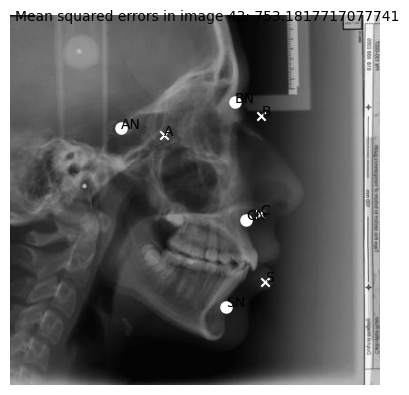

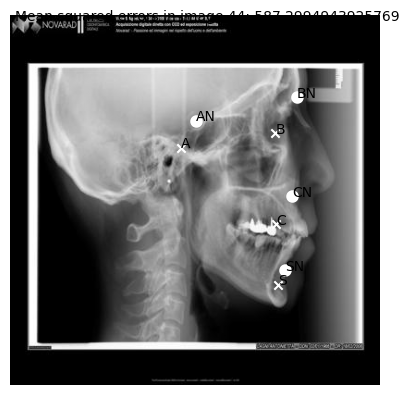

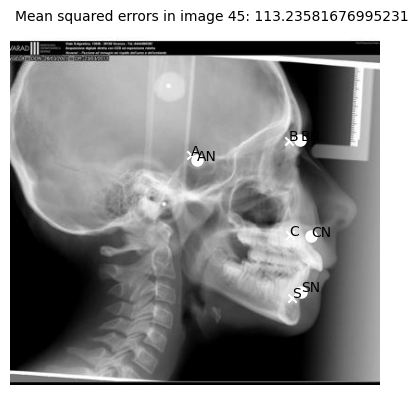

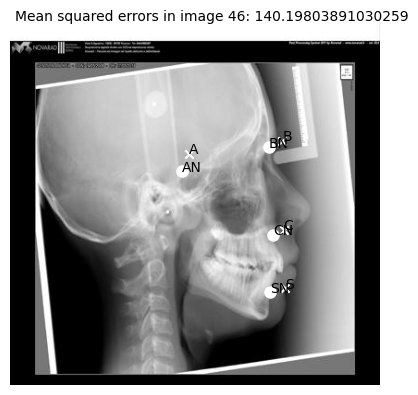

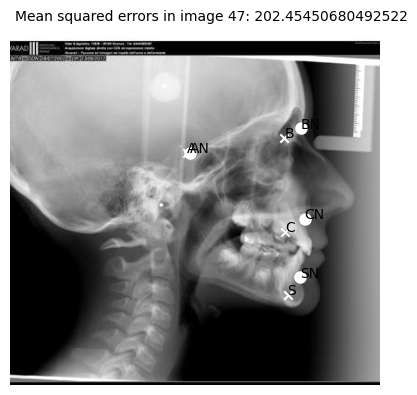

 75%|███████▌  | 3/4 [00:15<00:05,  5.03s/it]

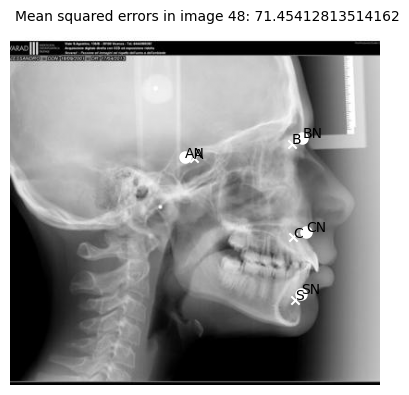

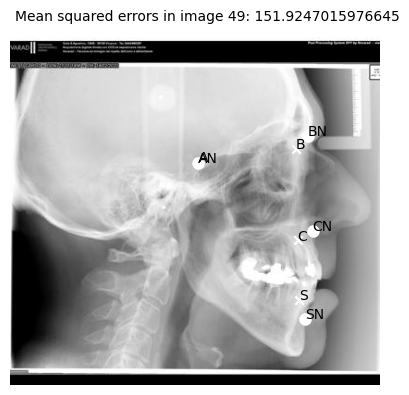

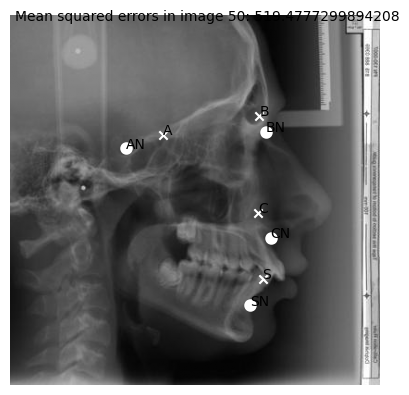

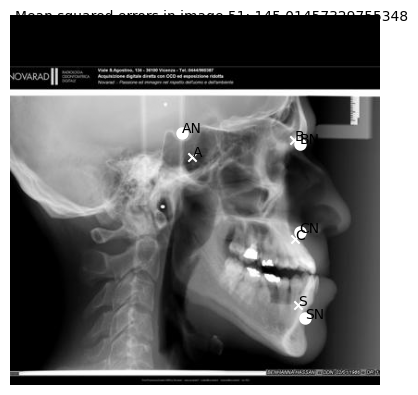

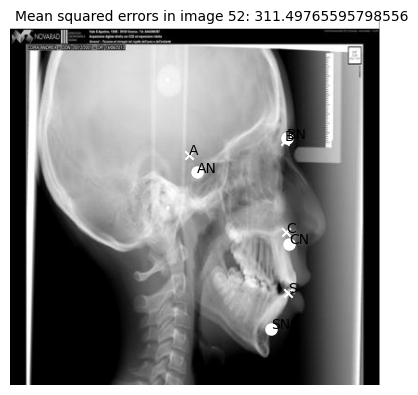

...

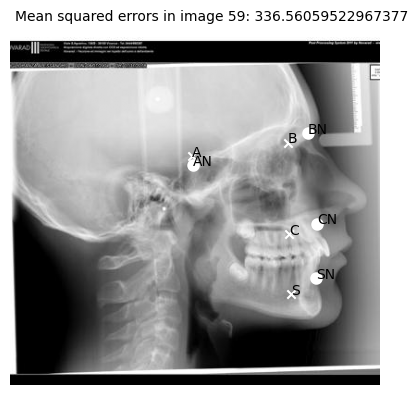

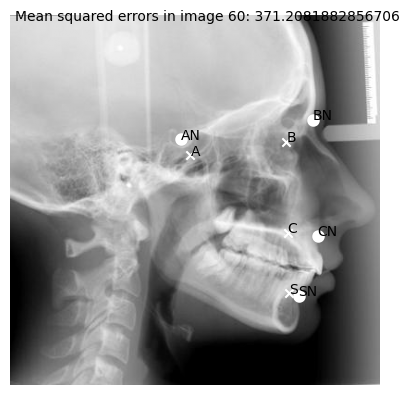

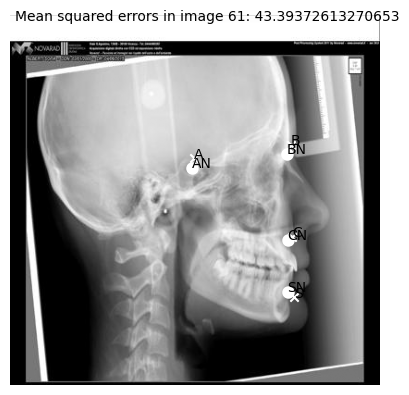

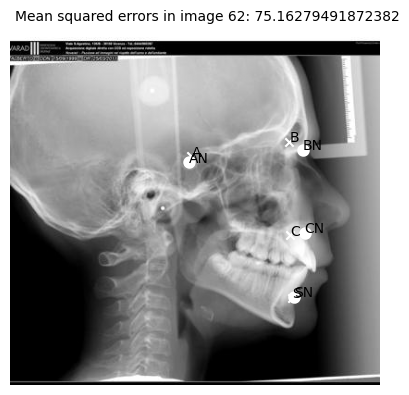

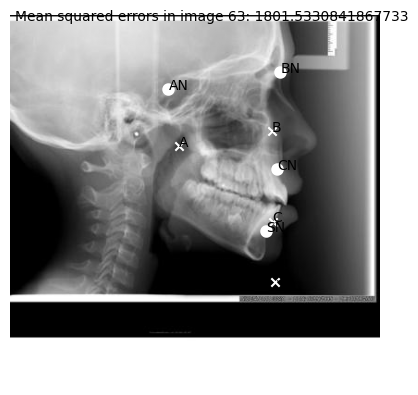

100%|██████████| 4/4 [00:20<00:00,  5.16s/it]


In [ ]:
def evaluate(valid_ds):
    # Get the results.
    results = model.predict(valid_ds)
    # Loop over the validation set and save the
    # images and corresponding result plot to disk.
    counter = 0
    for i, batch in tqdm(enumerate(valid_ds), total=len(valid_ds)):
        for j, (image, keypoints) in enumerate(zip(batch[0], batch[1])):
            path_string = os.path.join(IMG_VALID_PATH, str(counter)+'.png')
            evaluation_keypoints_plot(
                image, results[counter], keypoints, counter,
                save_path=path_string
            )
            counter += 1

print('Evaluating...')
evaluate(valid_ds)

Analogamente, la funzione test campiona le immagini contenute nell'insieme '*test_ds*' ed esegue la pre-elaborazione necessaria e prevede i keypoints sulle immagini, come recuperare il modello addestrato. Quindi salviamo le immagini risultanti su disch, dopo aver disegnato i keypoints, e le si mostra a schermo.



Testing...
1


  0%|          | 0/16 [00:00<?, ?it/s]

1/1 [==============================] - 0s 398ms/step


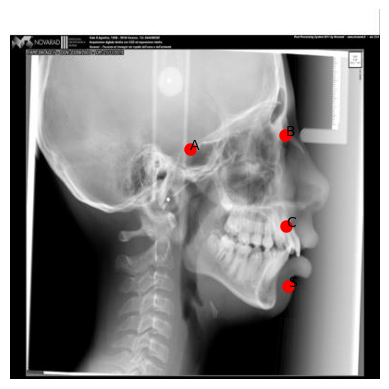

  6%|▋         | 1/16 [00:01<00:19,  1.33s/it]

1/1 [==============================] - 0s 78ms/step


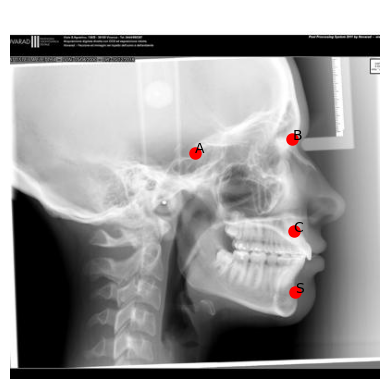

 12%|█▎        | 2/16 [00:01<00:12,  1.14it/s]

1/1 [==============================] - 0s 157ms/step


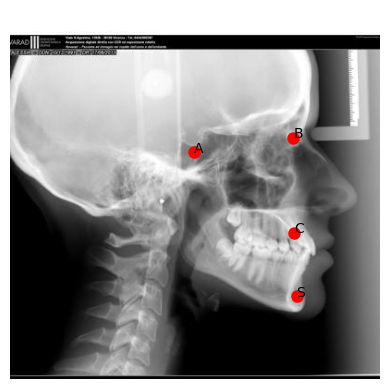

 19%|█▉        | 3/16 [00:02<00:09,  1.34it/s]

1/1 [==============================] - 0s 88ms/step


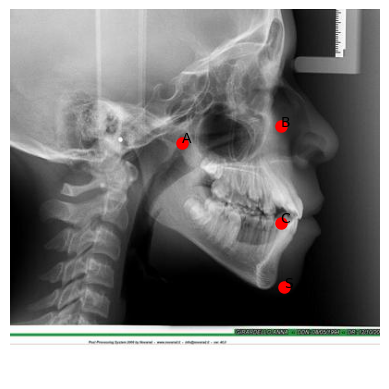

 25%|██▌       | 4/16 [00:03<00:08,  1.46it/s]

1/1 [==============================] - 0s 82ms/step


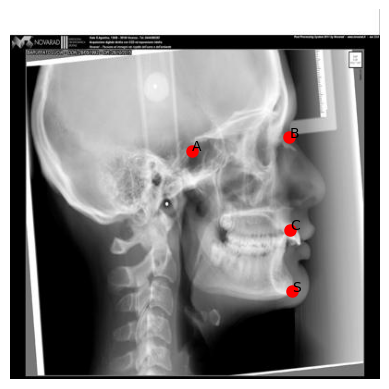

 31%|███▏      | 5/16 [00:03<00:06,  1.58it/s]

1/1 [==============================] - 0s 74ms/step


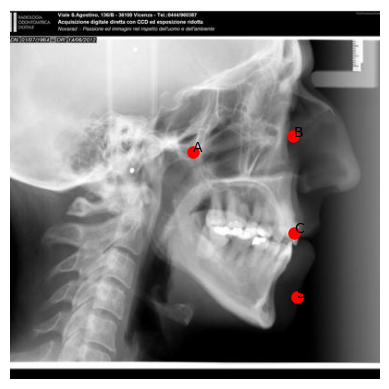

 38%|███▊      | 6/16 [00:04<00:05,  1.72it/s]

1/1 [==============================] - 0s 113ms/step


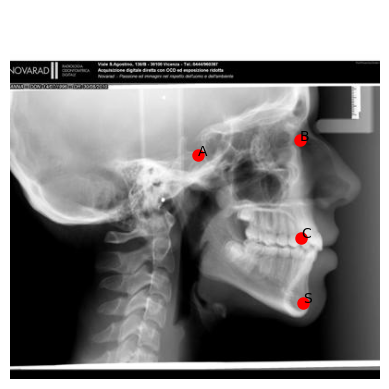

 44%|████▍     | 7/16 [00:04<00:05,  1.67it/s]

1/1 [==============================] - 0s 147ms/step


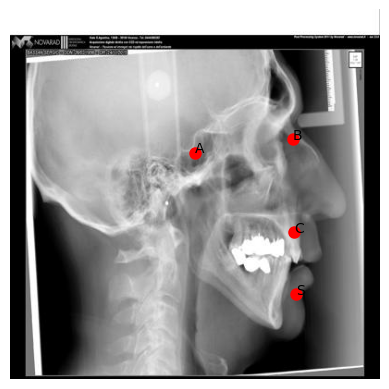

 50%|█████     | 8/16 [00:05<00:05,  1.56it/s]

1/1 [==============================] - 0s 234ms/step


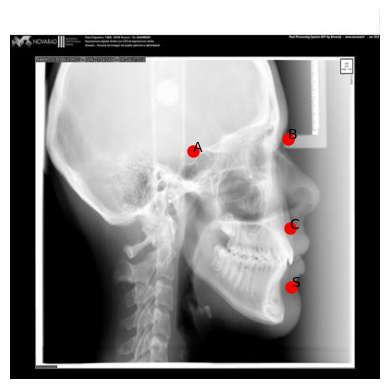

 56%|█████▋    | 9/16 [00:06<00:06,  1.15it/s]

1/1 [==============================] - 0s 81ms/step


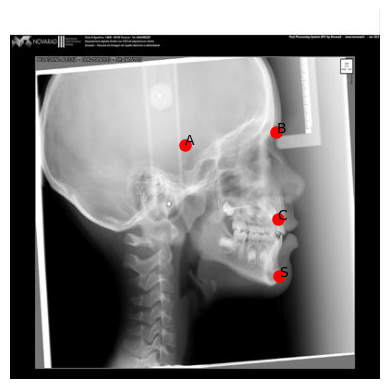

 62%|██████▎   | 10/16 [00:07<00:05,  1.20it/s]

1/1 [==============================] - 0s 77ms/step


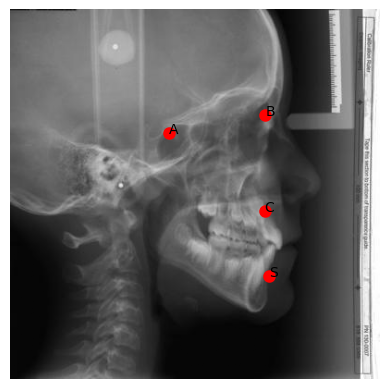

 69%|██████▉   | 11/16 [00:08<00:03,  1.34it/s]

1/1 [==============================] - 0s 152ms/step


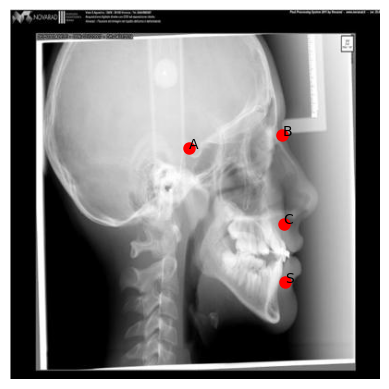

 75%|███████▌  | 12/16 [00:08<00:02,  1.44it/s]

1/1 [==============================] - 0s 112ms/step


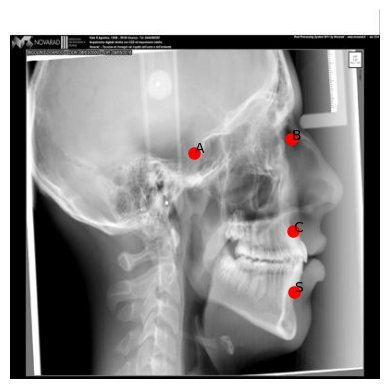

 81%|████████▏ | 13/16 [00:09<00:01,  1.51it/s]

1/1 [==============================] - 0s 82ms/step


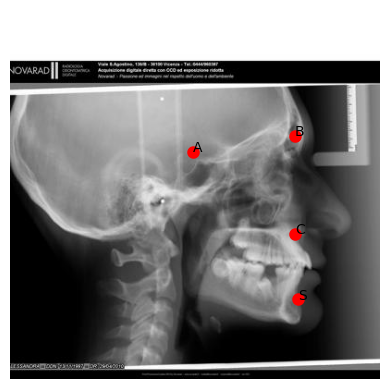

 88%|████████▊ | 14/16 [00:09<00:01,  1.61it/s]

1/1 [==============================] - 0s 75ms/step


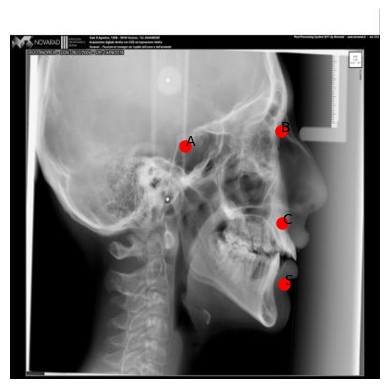

 94%|█████████▍| 15/16 [00:10<00:00,  1.75it/s]

1/1 [==============================] - 0s 95ms/step


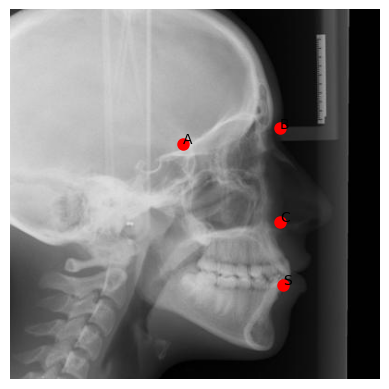

100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


In [ ]:
def test(test_ds):
    """
    ora il test_ds entra con una
    """
    counter = 0
    for i in tqdm(range(BATCH_SIZE)):
        image_test = test_ds[0][0][i]
        image =  np.array(image_test, dtype='float32')
        image = image.reshape(IMAGE_SIZE, IMAGE_SIZE,3)
        #qui devi controllare cosa arriva in DATA
        image_batch = np.expand_dims(image, axis=0)
        image_tensor = tf.convert_to_tensor(image_batch)
        outputs = model.predict(image_tensor)
        test_keypoints_plot(
            image, outputs, counter,
            save_path=os.path.join(IMG_TEST_PATH, str(i)+'.png')
        )
        counter += 1

print('Testing...')
print(str(len(test_ds)))
test(test_ds)

# Conclusioni

Il modello addestrato a questo punto risulta essere funzionale ai sensi del semplice progetto. Mi reputo abbastanza soddisfatto del risultato, anche se non perfetto.

Il codice di file è un mio tentativo di creare una mia vunzione che permette di vedere immediatamente se il paziente necessita dell'apparecchio odontoiatrico, le stime matematiche sugli angoli formati sul punto C, sono stati ottenuti attraverso formule abbastanza semplici che permettessero il confronto, ma inventate da me senza un vero riscontro "professionale" (è un tentativo/idea che mi piaceva).

In [ ]:
def stima_function(points):
  """
    allora questa funzione è INVENTATA!!!
    stimo io "ad occhio" le proporzioni rispetto ad una normale condizione di cranio
    e poi ho deciso dei colori funzionali al caso

    QUINDI:
         |-------------|
        |            B  |
       |    A            |
       |                  \
        |                __\
        |              C
        |        ------
       /         ____ S_\

  """
  color = 'white'
  a = np.array([float(points[0][0]),float(points[0][1])])
  b = np.array([float(points[1][0]),float(points[1][1])])
  c = np.array([float(points[2][0]),float(points[2][1])])
  s = np.array([float(points[3][0]),float(points[3][1])])
  #sto decidendo in torno al punto B a che range deve essere "valido" il punto S

  # i 2 punti di perno sono : A -- C -- S
  ac = a - c
  cs = s - c

  acs_cos_angle = np.dot(ac, cs) / (np.linalg.norm(ac) * np.linalg.norm(cs))
  acs = np.arccos(acs_cos_angle)

  print(np.degrees(acs))

  # secondo punto : B -- C -- S
  bc = b - c

  bcs_cos_angle = np.dot(bc, cs) / (np.linalg.norm(bc) * np.linalg.norm(cs))
  bcs = np.arccos(bcs_cos_angle)

  print(np.degrees(bcs))

  #allora se S è davanti a C c'è un problema
  if bcs < 180 :
    #se sono dietro devo iniziare con la matematica...
    if 110  < acs or acs < 130 :
      color = 'white'
    #questo è il PUNTO PIU' RANDOM DI TUTTI
    elif 55 < bcs - acs or  bcs - acs < 65 :
      color = 'yellow'
    else :
      color = 'red'
  else :
    color = 'red'

  return color

La funzione che segue, disegna le linee sugli esempi, basterebbe quindi aggiungere questa sui risultati degli esempi di test per ottenre una brutta ma efficace "*costom pose estimation*".

**TUTTAVIA** il problema di immettere il codice come parte integrante dell'applicazione sarebbe risultato in un errore siccome le immagini che vengono utilizzate durante tutto l'addestramento sono state **standardizzate**, ovvero a partire dalle dimensioni originari (X,Y), a volte anche (2600,3333), le ho ridimesionate TUTTE a (400,400), per permettere al modello un adeguato addestramento.

107.77138383269467
161.85428088558876


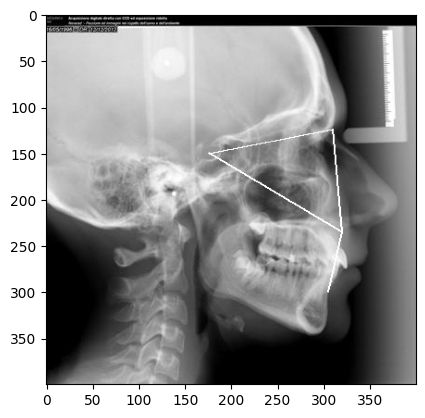

119.25280896823847
178.5398174823806


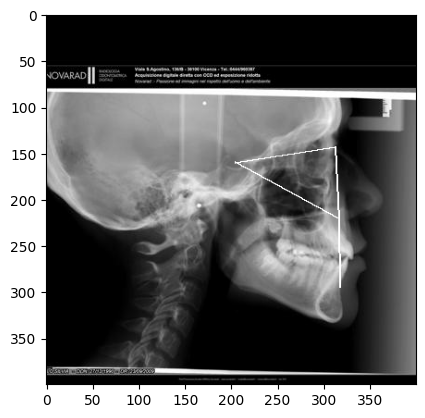

128.37922391768498
177.9917830097769


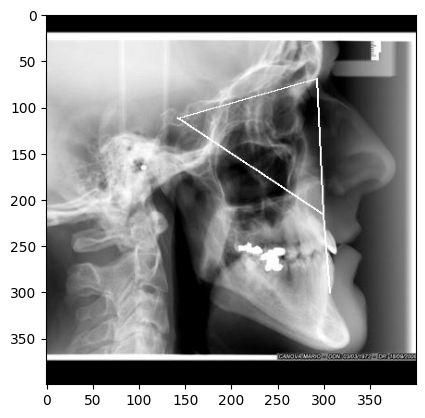

137.18051332442937
173.62883930954663


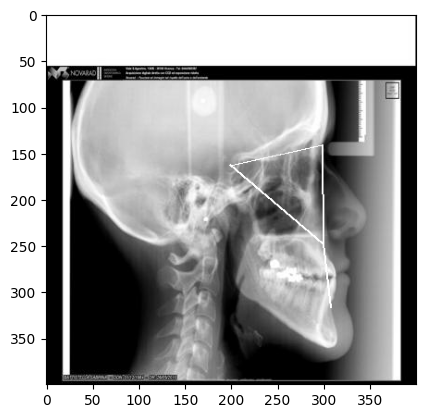

121.05163240868333
179.74371517311323


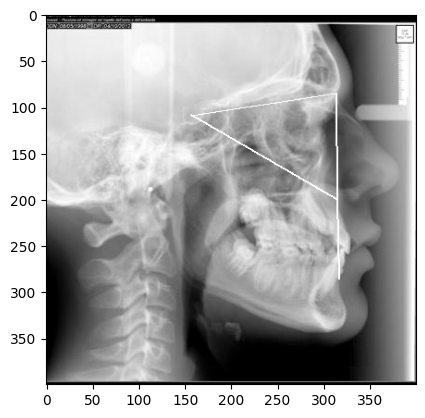

In [ ]:
def draw_lines_connecting_landmarks(path, points):
    """ draw landmarks over the image and return the figure

    :param image: path_to_image -> data['img_path']
    :param points: data['joints]

    """
    #------- img,  puntoStart, puntoStop, COLOR, spessore -------
    float_points = []
    for point in points :
      float_point_x = int(point[0])
      float_point_y = int(point[1])
      float_points.append([float_point_x,float_point_y])

    #-------------        Liena di collegamento:    A ------ B                                          bianco     spessore
    shape_AB = [(float_points[0][0],float_points[0][1]),  (float_points[1][0],float_points[1][1])]
    #-------------        Liena di collegamento:    B ------ C                                          bianco     spessore
    shape_BC = [(float_points[1][0],float_points[1][1]),  (float_points[2][0],float_points[2][1])]
    #-------------        Liena di collegamento:    C ------ A                                          bianco     spessore
    shape_CA = [(float_points[2][0],float_points[2][1]),  (float_points[0][0],float_points[0][1])]
    #ultima linea dipende dalle altre e dalla formula per sapere se la forma è giusto o sbalgiata, comprensibili con 3 colori
    #questa LA INVENTERO' IO
    #------------- Liena di collegamento per definizione:    B ------ S               'per ora'         bianco     spessore
    shape_BS = [(float_points[2][0],float_points[2][1]),  (float_points[3][0],float_points[3][1])]

    image = Image.open(path)
    draw = ImageDraw.Draw(image)

    draw.line(shape_AB, fill ="white", width = 2)
    draw.line(shape_BC, fill ="white", width = 2)
    draw.line(shape_CA, fill ="white", width = 2)
    fill_S = stima_function(points)
    draw.line(shape_BS, fill =fill_S, width = 2)

    return image

keys = test_ds.image_keys
count = 0
for key in keys:
    count+=1
    data = get_skull(key)
    # create line image
    #image = Image.open(data['img_new_path'])

    img = draw_lines_connecting_landmarks(data['img_new_path'], data['joints'])

    plt.imshow(img)
    plt.show()

    if count == 5 :
      break

plt.close()

Alla fine di questo modello ho sicuramente capito quanto importanti siano effettivamente i dataset, ovvero le immagini, in questo caso, o i valori in altri, che devono essere prepartati in aticipo o dovrebbero, come nel mio caso, essere vincolate nella raccolta o pre-lavorate per far rientrare ogni esempio nei requisiti delle NN che si sta addestrando.



Segue l'esperimento con la rete ispirata alla "AlexNet" descritta dal modello sequenziale nel applicazione. E come si nota dai valori ottenuti non sono riuscito ad ottenere dei risultati "apprezzabili".

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 132, 132, 16)      1216      
                                                                 
 batch_normalization (BatchN  (None, 132, 132, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 65, 65, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 65, 65, 32)        12832     
                                                                 
 batch_normalization_1 (Batc  (None, 65, 65, 32)       128       
 hNormalization)                                                 
                                                        

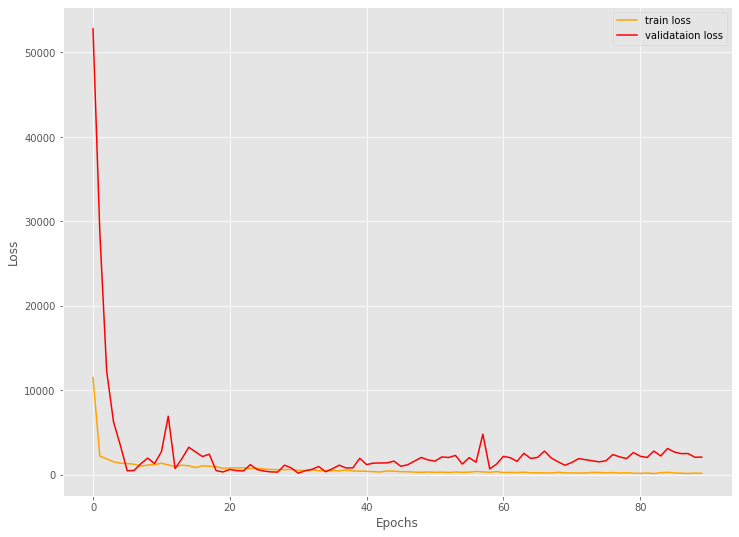

In [ ]:
# Model checkpoint callback.
model_ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/outputs/saved_model',
    monitor='val_loss',
    mode='auto',
    save_best_only=True
)

# Build and compile the model.
model = build_model_AlexNet((IMAGE_SIZE, IMAGE_SIZE))
print(model.summary())

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss=tf.keras.losses.MeanSquaredError(),
)

# Train the model.
history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCHS,
    callbacks=[model_ckpt],
    workers=4,
    use_multiprocessing=True
)

save_plots(history)